Initializing EfficientNet Explainer with GradCAM Evolution...
Using device: cuda
Loading effnet_model_0...
Registered hooks for: conv_stem
Registered hooks for: blocks.1
Registered hooks for: blocks.3
Registered hooks for: blocks.5
Registered hooks for: blocks.6
Registered hooks for: conv_head
 effnet_model_0 loaded successfully
Loading effnet_model_1...
Registered hooks for: conv_stem
Registered hooks for: blocks.1
Registered hooks for: blocks.3
Registered hooks for: blocks.5
Registered hooks for: blocks.6
Registered hooks for: conv_head
 effnet_model_1 loaded successfully
Loading effnet_model_2...
Registered hooks for: conv_stem
Registered hooks for: blocks.1
Registered hooks for: blocks.3
Registered hooks for: blocks.5
Registered hooks for: blocks.6
Registered hooks for: conv_head
 effnet_model_2 loaded successfully
Loading effnet_model_3...
Registered hooks for: conv_stem
Registered hooks for: blocks.1
Registered hooks for: blocks.3
Registered hooks for: blocks.5
Registered hooks f

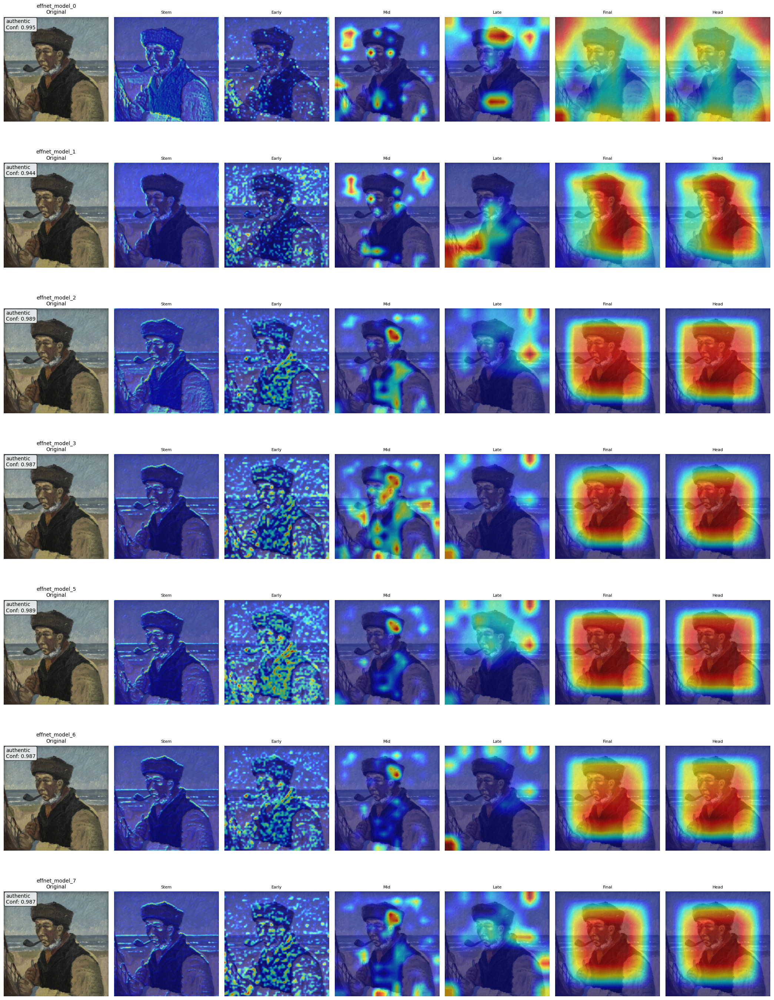

GradCAM evolution visualizations saved as: Elimar_9MB_gradcam_evolution.png
effnet_model_0                 (EffNet v0      ): authentic  | Conf: 0.995 | Auth: 0.995 | Imit: 0.005
effnet_model_1                 (EffNet v1      ): authentic  | Conf: 0.944 | Auth: 0.944 | Imit: 0.056
effnet_model_2                 (EffNet v2      ): authentic  | Conf: 0.989 | Auth: 0.989 | Imit: 0.011
effnet_model_3                 (EffNet v3      ): authentic  | Conf: 0.987 | Auth: 0.987 | Imit: 0.013
effnet_model_5                 (EffNet v5      ): authentic  | Conf: 0.989 | Auth: 0.989 | Imit: 0.011
effnet_model_6                 (EffNet v6      ): authentic  | Conf: 0.987 | Auth: 0.987 | Imit: 0.013
effnet_model_7                 (EffNet v7      ): authentic  | Conf: 0.987 | Auth: 0.987 | Imit: 0.013

[2/2] Elimar_19MB.png
------------------------------------------------------------
Processing: /content/test_images/Elimar_19MB.png
  Running effnet_model_0...
    effnet_model_0: authentic (1.000)
    

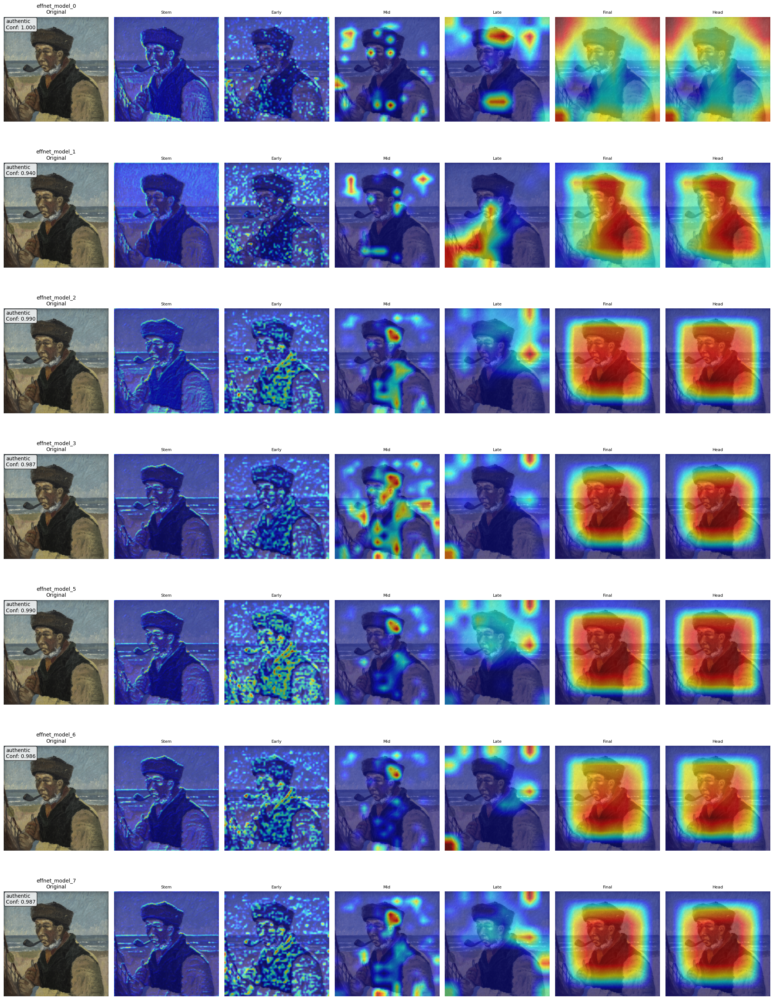

GradCAM evolution visualizations saved as: Elimar_19MB_gradcam_evolution.png
effnet_model_0                 (EffNet v0      ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
effnet_model_1                 (EffNet v1      ): authentic  | Conf: 0.940 | Auth: 0.940 | Imit: 0.060
effnet_model_2                 (EffNet v2      ): authentic  | Conf: 0.990 | Auth: 0.990 | Imit: 0.010
effnet_model_3                 (EffNet v3      ): authentic  | Conf: 0.987 | Auth: 0.987 | Imit: 0.013
effnet_model_5                 (EffNet v5      ): authentic  | Conf: 0.990 | Auth: 0.990 | Imit: 0.010
effnet_model_6                 (EffNet v6      ): authentic  | Conf: 0.986 | Auth: 0.986 | Imit: 0.014
effnet_model_7                 (EffNet v7      ): authentic  | Conf: 0.987 | Auth: 0.987 | Imit: 0.013

Processing completed!


In [1]:
import torch
import torch.nn.functional as F
import timm
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from pathlib import Path
import json
from datetime import datetime
import pandas as pd
import os
from typing import List, Dict
import cv2
import matplotlib.pyplot as plt
from matplotlib import gridspec
import math

class EfficientNetGradCAMExplainer:
    """
    EfficientNet explainability using GradCAM across key convolutional layers
    Shows how feature focus evolves through the network depth
    """

    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.gradients = {}
        self.activations = {}
        self.hooks = []

        # Key layers for evolution visualization (6 layers total)
        self.target_layers = [
            'conv_stem',           # Initial feature extraction
            'blocks.1',            # Early MBConv - low-level patterns
            'blocks.3',            # Mid MBConv - object parts
            'blocks.5',            # Late MBConv - high-level features
            'blocks.6',            # Final MBConv - pre-classification
            'conv_head'            # Head conv - final semantic features
        ]

        self._register_hooks()

    def _register_hooks(self):
        """Register hooks for key convolutional layers"""

        def get_activation_hook(name):
            def hook_fn(module, input, output):
                self.activations[name] = output.detach()
            return hook_fn

        def get_gradient_hook(name):
            def hook_fn(module, grad_input, grad_output):
                self.gradients[name] = grad_output[0].detach()
            return hook_fn

        # Register hooks for target layers
        for layer_name in self.target_layers:
            try:
                # Navigate to the layer
                layer = self.model
                for attr in layer_name.split('.'):
                    layer = getattr(layer, attr)

                # Register forward and backward hooks
                fwd_hook = layer.register_forward_hook(get_activation_hook(layer_name))
                bwd_hook = layer.register_full_backward_hook(get_gradient_hook(layer_name))

                self.hooks.extend([fwd_hook, bwd_hook])
                print(f"Registered hooks for: {layer_name}")

            except AttributeError:
                print(f"Warning: Could not find layer {layer_name}")

    def generate_gradcam_evolution(self, input_tensor, target_class=None):

        self.gradients.clear()
        self.activations.clear()

        # Forward pass
        input_tensor.requires_grad_(True)
        output = self.model(input_tensor)

        # Get target class
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        # Backward pass
        self.model.zero_grad()
        output[0, target_class].backward()

        gradcam_maps = {}

        # Generate GradCAM for each target layer
        for layer_name in self.target_layers:
            if layer_name in self.activations and layer_name in self.gradients:
                gradcam = self._compute_gradcam(
                    self.activations[layer_name],
                    self.gradients[layer_name]
                )
                gradcam_maps[layer_name] = gradcam

        return gradcam_maps

    def _compute_gradcam(self, activations, gradients):
        """Compute GradCAM from activations and gradients"""
        # activations: [1, C, H, W]
        # gradients: [1, C, H, W]

        # Global average pooling of gradients
        weights = torch.mean(gradients, dim=(2, 3), keepdim=True)  # [1, C, 1, 1]

        # Weighted combination of activation maps
        gradcam = torch.sum(weights * activations, dim=1, keepdim=True)  # [1, 1, H, W]

        # Apply ReLU and normalize
        gradcam = F.relu(gradcam)

        # Resize to input size for consistency
        gradcam = F.interpolate(gradcam, size=(224, 224), mode='bilinear', align_corners=False)

        # Normalize to [0, 1]
        gradcam = gradcam.squeeze().cpu().numpy()
        if gradcam.max() > gradcam.min():
            gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min())

        return gradcam

    def clear_hooks(self):
        """Remove all hooks"""
        for hook in self.hooks:
            hook.remove()
        self.hooks.clear()


class MultiModelEfficientNetGradCAM:
    def __init__(self, model_configs: List[Dict], device=None):
        self.model_configs = model_configs

        if device is None:
            if torch.backends.mps.is_available() and torch.backends.mps.is_built():
                self.device = torch.device("mps")
            elif torch.cuda.is_available():
                self.device = torch.device("cuda")
            else:
                self.device = torch.device("cpu")
        else:
            self.device = torch.device(device)

        print(f"Using device: {self.device}")

        self.class_to_idx = {'authentic': 0, 'imitation': 1}
        self.idx_to_class = {v: k for k, v in self.class_to_idx.items()}

        # Load all models
        self.models = {}
        self.explainers = {}
        self._load_all_models()

        # Define transforms
        self.transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])

        print(f"Successfully loaded {len(self.models)} EfficientNet models")

    def _load_all_models(self):
        for config in self.model_configs:
            model_name = config['name']
            model_path = config['path']

            print(f"Loading {model_name}...")

            try:
                # Create EfficientNet model
                model = timm.create_model(
                    'efficientnet_b5',
                    pretrained=False,
                    num_classes=2
                )

                # Load weights
                state_dict = torch.load(model_path, map_location=self.device)
                model.load_state_dict(state_dict)

                model.to(self.device)
                model.eval()

                self.models[model_name] = {
                    'model': model,
                    'category': config['category'],
                    'path': model_path
                }

                # Create explainer for this model
                self.explainers[model_name] = EfficientNetGradCAMExplainer(model, self.device)

                print(f" {model_name} loaded successfully")

            except Exception as e:
                print(f" Error loading {model_name}: {e}")
                raise

    def show_gradcam_on_image(self, img: np.ndarray, gradcam_map: np.ndarray,
                             colormap: int = cv2.COLORMAP_JET,
                             image_weight: float = 0.5) -> np.ndarray:
        """Overlay GradCAM map on image"""
        # Resize gradcam map to image size
        gradcam_resized = cv2.resize(gradcam_map, (img.shape[1], img.shape[0]))

        # Apply colormap (JET: blue=low, red=high)
        heatmap = cv2.applyColorMap(np.uint8(255 * gradcam_resized), colormap)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        heatmap = np.float32(heatmap) / 255

        if np.max(img) > 1:
            raise Exception("The input image should np.float32 in the range [0, 1]")

        # Combine image and heatmap
        combined = (1 - image_weight) * heatmap + image_weight * img
        combined = combined / np.max(combined)
        return np.uint8(255 * combined)

    def preprocess_image(self, image_path):
        try:
            image = Image.open(image_path).convert('RGB')
            return image
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            raise

    def generate_gradcam_explanation(self, image, model_info, explainer, target_class=None):
        """Generate GradCAM evolution for a single model"""
        model = model_info['model']

        # Prepare image
        img_tensor = self.transform(image).unsqueeze(0).to(self.device)

        # Convert image to numpy for visualization
        rgb_img = np.array(image.resize((256, 256))) / 255.0

        # Generate GradCAM evolution
        gradcam_maps = explainer.generate_gradcam_evolution(img_tensor, target_class)

        # Create visualizations for each layer
        visualizations = {}
        for layer_name, gradcam_map in gradcam_maps.items():
            visualization = self.show_gradcam_on_image(rgb_img, gradcam_map)
            visualizations[layer_name] = visualization

        return visualizations, gradcam_maps

    def predict_with_patches_single_model(self, image, model_info, patch_size=256, stride=128):
        model = model_info['model']
        img_width, img_height = image.size

        patches = []
        patch_coords = []

        for y in range(0, img_height - patch_size + 1, stride):
            for x in range(0, img_width - patch_size + 1, stride):
                patch = image.crop((x, y, x + patch_size, y + patch_size))
                patch_tensor = self.transform(patch).unsqueeze(0).to(self.device)
                patches.append(patch_tensor)
                patch_coords.append((x, y))

        if not patches:
            # If image is too small, resize it
            resized_image = image.resize((patch_size, patch_size))
            patch_tensor = self.transform(resized_image).unsqueeze(0).to(self.device)
            patches = [patch_tensor]
            patch_coords = [(0, 0)]

        all_logits = []
        with torch.no_grad():
            for patch in patches:
                logits = model(patch)
                all_logits.append(logits)

        stacked_logits = torch.cat(all_logits, dim=0)
        avg_logits = torch.mean(stacked_logits, dim=0, keepdim=True)

        # Apply softmax to get probabilities
        probabilities = F.softmax(avg_logits, dim=1)

        # Get prediction
        predicted_class_idx = torch.argmax(probabilities, dim=1).item()
        predicted_class = self.idx_to_class[predicted_class_idx]

        # Get confidence scores
        confidence_scores = probabilities.cpu().numpy()[0]
        max_confidence = float(confidence_scores[predicted_class_idx])

        return {
            'predicted_class': predicted_class,
            'predicted_class_idx': predicted_class_idx,
            'confidence': max_confidence,
            'probabilities': {
                'authentic': float(confidence_scores[0]),
                'imitation': float(confidence_scores[1])
            },
            'num_patches': len(patches),
            'model_category': model_info['category']
        }

    def predict_single_image_with_explanation(self, image_path, patch_size=256, stride=128,
                                            generate_explanation=True, save_visualizations=True):
        print(f"Processing: {image_path}")

        # Load and preprocess image
        image = self.preprocess_image(image_path)

        results = {
            'image_path': str(image_path),
            'image_size': image.size,
            'patch_size': patch_size,
            'stride': stride,
            'timestamp': datetime.now().isoformat(),
            'models': {}
        }

        gradcam_visualizations = {}

        # Run inference with each model
        for model_name, model_info in self.models.items():
            print(f"  Running {model_name}...")
            try:
                # Get prediction
                model_result = self.predict_with_patches_single_model(
                    image, model_info, patch_size, stride
                )
                results['models'][model_name] = model_result

                print(f"    {model_name}: {model_result['predicted_class']} ({model_result['confidence']:.3f})")

                # Generate GradCAM explanation if requested
                if generate_explanation:
                    print(f"    Generating GradCAM evolution for {model_name}...")
                    try:
                        explainer = self.explainers[model_name]
                        visualization, gradcam_map = self.generate_gradcam_explanation(
                            image, model_info, explainer,
                            target_class=model_result['predicted_class_idx']
                        )
                        gradcam_visualizations[model_name] = visualization
                        print(f"    GradCAM evolution generated for {model_name}")
                    except Exception as e:
                        print(f"    Error generating GradCAM explanation for {model_name}: {e}")

            except Exception as e:
                print(f"    Error with {model_name}: {e}")
                results['models'][model_name] = {'error': str(e)}

        # Save visualizations if requested
        if save_visualizations and gradcam_visualizations:
            self._save_gradcam_visualizations(image_path, gradcam_visualizations, results)

        return results, gradcam_visualizations

    def _save_gradcam_visualizations(self, image_path, gradcam_visualizations, results):
        """Save GradCAM evolution visualizations as a combined figure"""
        image_name = Path(image_path).stem

        # Get layer names from the first model
        first_model = list(gradcam_visualizations.keys())[0]
        layer_names = list(gradcam_visualizations[first_model].keys())
        num_layers = len(layer_names)
        num_models = len(gradcam_visualizations)

        # Create figure: rows = models, columns = layers + 1 (original)
        fig = plt.figure(figsize=(3 * (num_layers + 1), 4 * num_models))
        gs = gridspec.GridSpec(num_models, num_layers + 1, width_ratios=[1] + [1] * num_layers)

        # Add original image
        original_image = Image.open(image_path).convert('RGB')
        original_resized = original_image.resize((256, 256))

        model_names = list(gradcam_visualizations.keys())

        # Layer name mapping for cleaner titles
        layer_titles = {
            'conv_stem': 'Stem',
            'blocks.1': 'Early',
            'blocks.3': 'Mid',
            'blocks.5': 'Late',
            'blocks.6': 'Final',
            'conv_head': 'Head'
        }

        for i, model_name in enumerate(model_names):
            # Plot original image in first column
            ax = fig.add_subplot(gs[i, 0])
            ax.imshow(original_resized)
            ax.set_title(f'{model_name}\nOriginal', fontsize=10)
            ax.axis('off')

            # Add prediction info
            model_result = results['models'][model_name]
            pred_text = f"{model_result['predicted_class']}\nConf: {model_result['confidence']:.3f}"
            ax.text(0.02, 0.98, pred_text, transform=ax.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            # Plot GradCAM maps for each layer
            layer_visualizations = gradcam_visualizations[model_name]
            for j, layer_name in enumerate(layer_names):
                ax = fig.add_subplot(gs[i, j + 1])
                ax.imshow(layer_visualizations[layer_name], interpolation='bilinear')

                # Use cleaner layer titles
                title = layer_titles.get(layer_name, layer_name)
                ax.set_title(f'{title}', fontsize=8)
                ax.axis('off')

        plt.tight_layout()

        # Save figure
        output_path = f"{image_name}_gradcam_evolution.png"
        plt.savefig(output_path, format='png', dpi=300, bbox_inches='tight')
        plt.show()

        print(f"GradCAM evolution visualizations saved as: {output_path}")

    def predict_folder_with_explanation(self, folder_path, patch_size=256, stride=128,
                                      generate_explanation=True, save_visualizations=True):
        folder_path = Path(folder_path)

        # Supported image extensions
        image_extensions = {'.jpg', '.jpeg', '.png', '.jp2', '.tiff', '.tif'}

        # Find all image files
        image_files = []
        for ext in image_extensions:
            image_files.extend(folder_path.glob(f'*{ext}'))
            image_files.extend(folder_path.glob(f'*{ext.upper()}'))

        print(f"Found {len(image_files)} images in {folder_path}")
        print("Using GradCAM evolution visualization")
        print("="*80)

        if not image_files:
            print("No images found!")
            return

        # Process each image
        all_results = []
        for i, image_path in enumerate(image_files, 1):
            print(f"\n[{i}/{len(image_files)}] {image_path.name}")
            print("-" * 60)

            try:
                result, gradcam_vis = self.predict_single_image_with_explanation(
                    image_path, patch_size, stride, generate_explanation, save_visualizations
                )
                all_results.append(result)

                # Print results for each model
                for model_name, model_result in result['models'].items():
                    if 'error' not in model_result:
                        pred = model_result['predicted_class']
                        conf = model_result['confidence']
                        auth_prob = model_result['probabilities']['authentic']
                        imit_prob = model_result['probabilities']['imitation']
                        category = model_result['model_category']

                        print(f"{model_name:30} ({category:15}): {pred:10} | Conf: {conf:.3f} | Auth: {auth_prob:.3f} | Imit: {imit_prob:.3f}")
                    else:
                        print(f"{model_name:30} (ERROR): {model_result['error']}")

            except Exception as e:
                print(f"  ERROR processing {image_path}: {e}")
                continue

        return all_results

    def cleanup(self):
        """Clean up all hooks"""
        for explainer in self.explainers.values():
            explainer.clear_hooks()


def main():
    # Model configurations - EfficientNet models
    MODEL_CONFIGS = [
        {
            'path': '/efficientnet_unstable_model_run1.pth',
            'name': 'effnet_model_0',
            'category': 'EffNet v0'
        },
        {
            'path': '/efficientnet_stable_model_run1.pth',
            'name': 'effnet_model_1',
            'category': 'EffNet v1'
        },
        {
            'path': '/efficientnet_stable_model_run2.pth',
            'name': 'effnet_model_2',
            'category': 'EffNet v2'
        },
        {
            'path': '/efficientnet_stable_model_run3.pth',
            'name': 'effnet_model_3',
            'category': 'EffNet v3'
        },
        {
            'path': '/efficientnet_stable_model_run5.pth',
            'name': 'effnet_model_5',
            'category': 'EffNet v5'
        },
        {
            'path': '/efficientnet_stable_model_run6.pth',
            'name': 'effnet_model_6',
            'category': 'EffNet v6'
        },
        {
            'path': '/efficientnet_stable_model_run7.pth',
            'name': 'effnet_model_7',
            'category': 'EffNet v7'
        }
    ]

    # Input folder containing images
    INPUT_FOLDER = "/content/test_images"

    PATCH_SIZE = 256
    STRIDE = 128

    print("Initializing EfficientNet Explainer with GradCAM Evolution...")

    explainer = MultiModelEfficientNetGradCAM(MODEL_CONFIGS)

    try:
        # Run inference with GradCAM explanations
        results = explainer.predict_folder_with_explanation(
            folder_path=INPUT_FOLDER,
            patch_size=PATCH_SIZE,
            stride=STRIDE,
            generate_explanation=True,
            save_visualizations=True
        )

        print("\nProcessing completed!")

    finally:
        # Clean up hooks
        explainer.cleanup()

if __name__ == "__main__":
    main()